In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set(["2707_20 TB BAL Human neu.svs", 
                         "10080_19 humane BAL Berliner Blau-001.svs", 
                         "10052_19 humane BAL Berliner Blau-001.svs", 
                         "10835_19 humane BAL Berliner Blau.svs", 
                         "10227_19 humane BAL Berliner Blau.svs" 
                        ]))

slides_val = list(set(["11480_19 humane BAL Berliner Blau.svs", "2702_20 BB Human BAL-001.svs"]))

In [9]:
grade_list = [0, 1]
annotations_path = Path("../../Statistics/EIPH_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)
annotations["image_name"] = [name.replace("tiff","svs") for name in annotations["image_name"]]
annotations = annotations[annotations["grade"].isin(grade_list)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,unique_identifier,user_id,deleted,last_editor,data_set_name,version
119329,2200930,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 21647, 'x2': 21751, 'y1': 18133, 'y2': ...",22ffc5a6-56da-41ef-bef4-69e54413bddd,1,False,1,SDATA,Inference
119330,2205439,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 4512, 'x2': 4667, 'y1': 8242, 'y2': 8397}",3d0d194e-0fef-4b91-b2d4-957e8007c3b9,1,False,1,SDATA,Inference
119331,2209572,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 1640, 'x2': 1778, 'y1': 17751, 'y2': 17...",0a3b7d83-2f8d-4ed1-a194-e3eaaaa4e7a9,1,False,1,SDATA,Inference
119332,2209835,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 26641, 'x2': 26808, 'y1': 10599, 'y2': ...",54541283-3220-42a6-b9b0-9bbf5af7eda6,1,False,1,SDATA,Inference
119333,2210512,3623,251,human,3106_20 BB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 9363, 'x2': 9514, 'y1': 21971, 'y2': 22...",47aaea20-97d3-42f2-abd3-88b8d7853ac4,1,False,1,SDATA,Inference


In [14]:
slides_path = Path("../../../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs")  if slide.name in slides_train + slides_val}
files

{'10080_19 humane BAL Berliner Blau-001.svs': PosixPath('../../../Slides/Human/10080_19 humane BAL Berliner Blau-001.svs'),
 '10120_19 humane BAL Turnbull Blau.svs': PosixPath('../../../Slides/Human/10120_19 humane BAL Turnbull Blau.svs'),
 '10277_19 humane BAL Turnbull Blau.svs': PosixPath('../../../Slides/Human/10277_19 humane BAL Turnbull Blau.svs'),
 '10672_19 humane BAL Turnbull Blau.svs': PosixPath('../../../Slides/Human/10672_19 humane BAL Turnbull Blau.svs'),
 '10854_19 humane BAL Turnbull Blau.svs': PosixPath('../../../Slides/Human/10854_19 humane BAL Turnbull Blau.svs'),
 '11480_19 humane BAL Berliner Blau.svs': PosixPath('../../../Slides/Human/11480_19 humane BAL Berliner Blau.svs'),
 '11480_19 humane BAL Turnbull Blau.svs': PosixPath('../../../Slides/Human/11480_19 humane BAL Turnbull Blau.svs'),
 '3106_20 BB BAL Human neu.svs': PosixPath('../../../Slides/Human/3106_20 BB BAL Human neu.svs')}

In [15]:
size = 1024 
level = 0
bs = 16
train_images = 2500
val_images = 1500
experiment_name = "HumanVsHuman"

In [16]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]

    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]

    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [17]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.5, resolved={}, do_run=True, is_random=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True)])

In [18]:
def get_y_func(x):
    return x.y

In [20]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate).normalize()

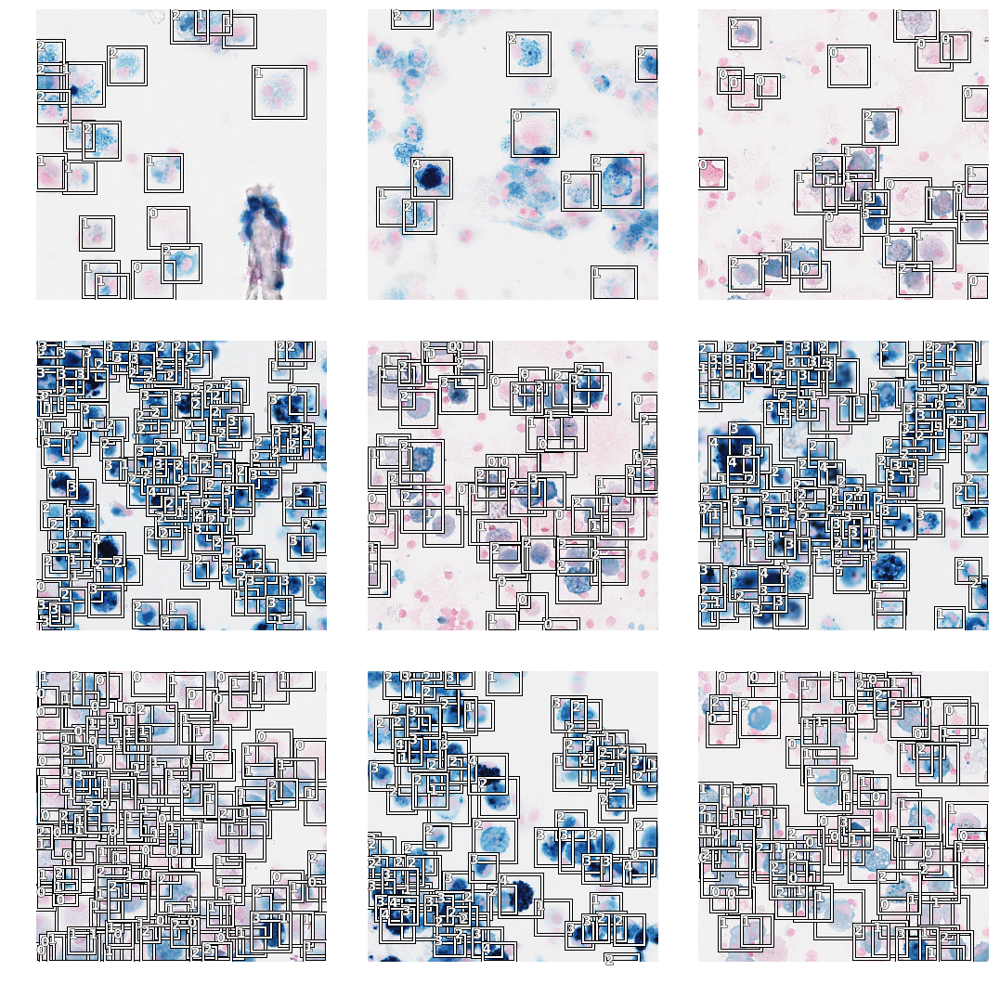

In [21]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

In [22]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.6, 0.7, 0.9, 1.25, 1.5])

In [23]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=5, sizes=[32], chs=128, final_bias=-4., n_conv=3)

In [24]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, partial(CSVLogger, append=False, filename=experiment_name)], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [25]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [ ]:
learn.lr_find()
learn.recorder.plot()

In [27]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,AP-2,AP-3,AP-4,time
0,0.207769,0.255719,0.666173,0.079878,0.175841,0.859484,0.853866,0.772188,0.473434,0.371893,11:16
1,0.244448,0.210548,0.682056,0.065045,0.145502,0.829977,0.843589,0.711228,0.715715,0.309771,10:28
2,0.236655,0.282713,0.653462,0.079202,0.203510,0.776695,0.767967,0.770376,0.635279,0.316989,10:05
3,0.230322,0.186882,0.676255,0.052786,0.134096,0.884649,0.917648,0.662773,0.730445,0.185763,11:00
4,0.188579,0.143604,0.697504,0.044897,0.098707,0.850251,0.878706,0.859243,0.804905,0.094417,10:07
5,0.174907,0.127310,0.773250,0.037471,0.089839,0.879389,0.920070,0.800464,0.814142,0.452183,10:25
6,0.156975,0.120652,0.723981,0.036850,0.083801,0.912577,0.885398,0.907141,0.778096,0.136692,10:19
7,0.145638,0.101219,0.758804,0.033808,0.067411,0.909024,0.902528,0.902479,0.794535,0.285455,10:18
8,0.130697,0.101237,0.783848,0.034119,0.067118,0.929326,0.912897,0.877668,0.872913,0.326438,10:32
9,0.127120,0.098157,0.773812,0.032812,0.065345,0.926368,0.925216,0.886489,0.855251,0.275735,10:24


In [29]:
import pickle

stats = {"anchors": anchors,
         "mean": to_np(data.stats[0]),
         "std": to_np(data.stats[1]),
         "size": size,
         "n_classes": 6,
         "n_anchors": 5,
         "sizes": [32],
         "chs": 128,
         "encoder": "RN-18",
         "n_conv": 3,
         "level": 0,
         "model": get_model(learn.model).state_dict()
        }
torch.save(stats, "{}.p".format(experiment_name))

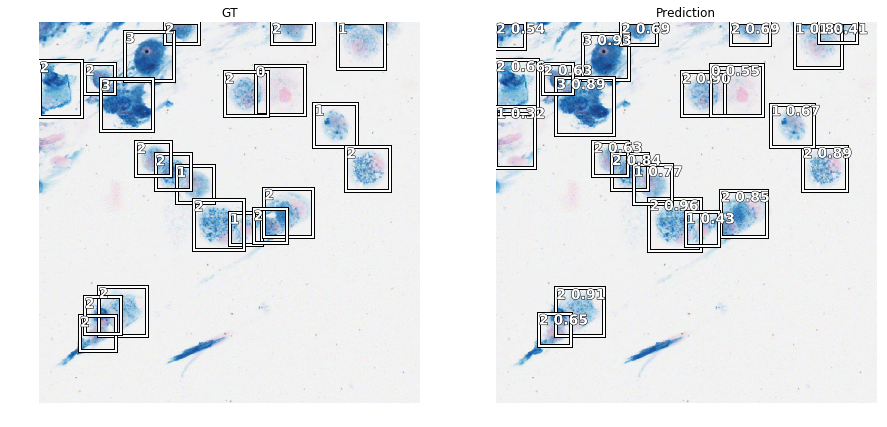

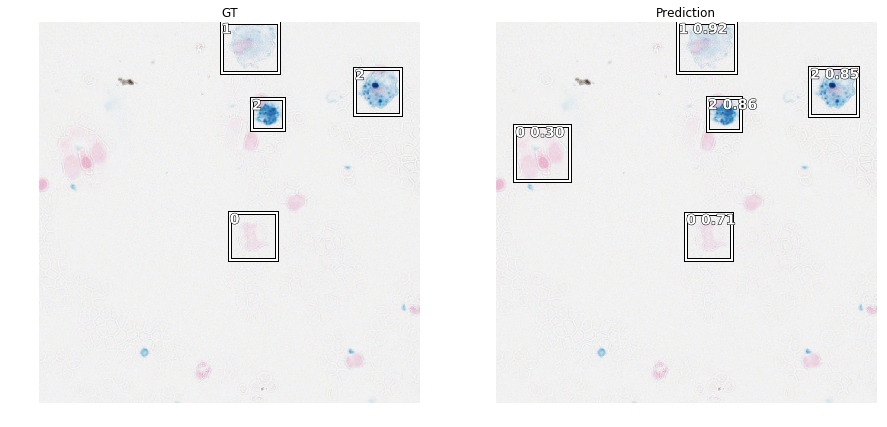

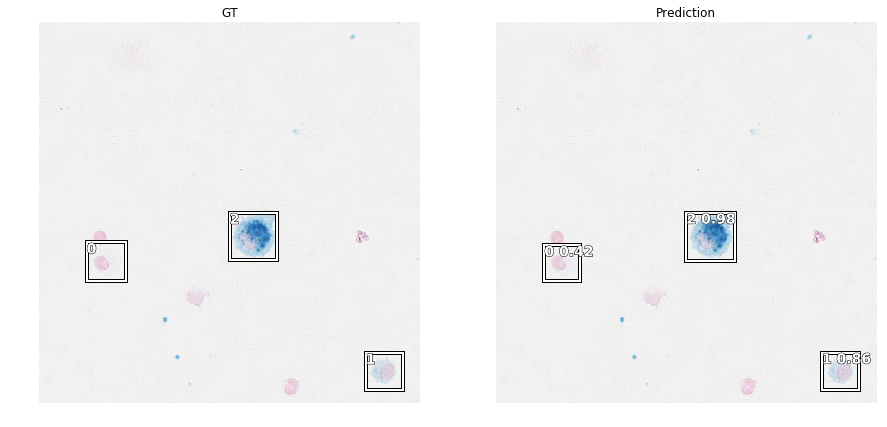

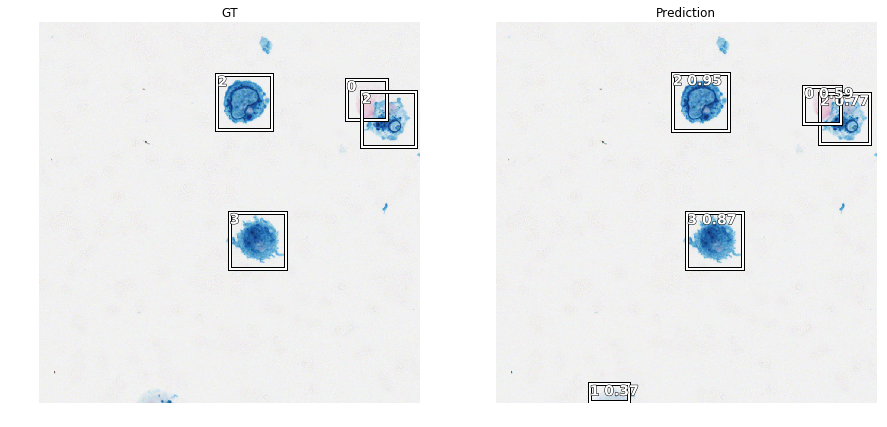

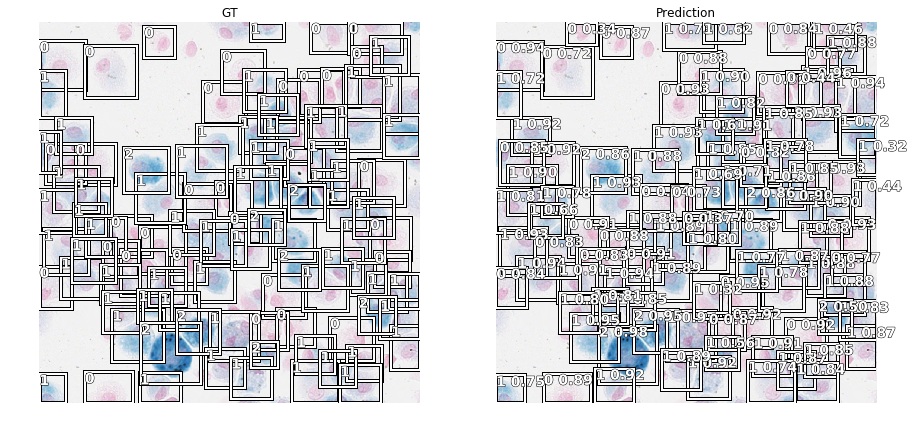

...

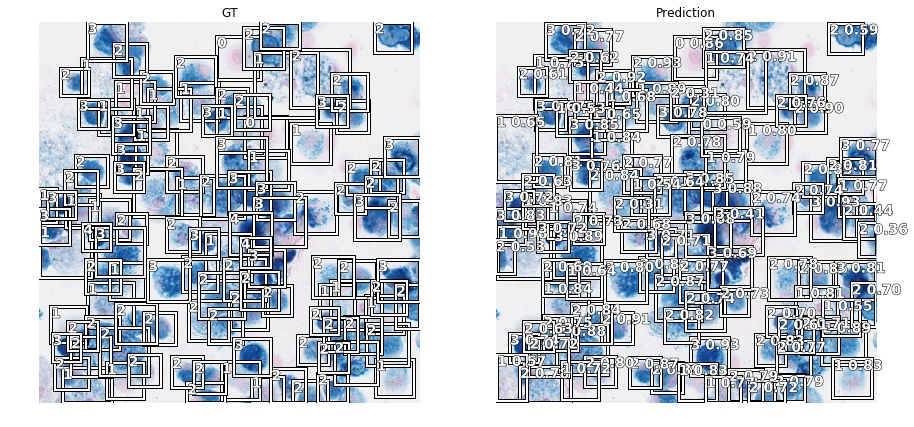

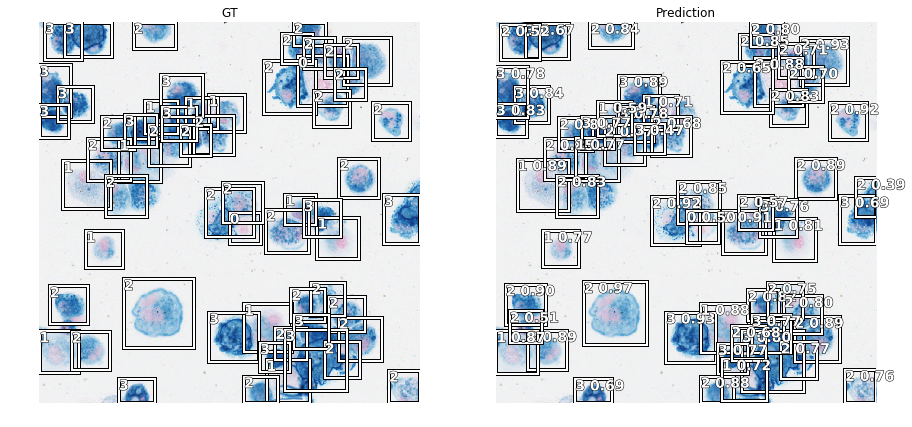

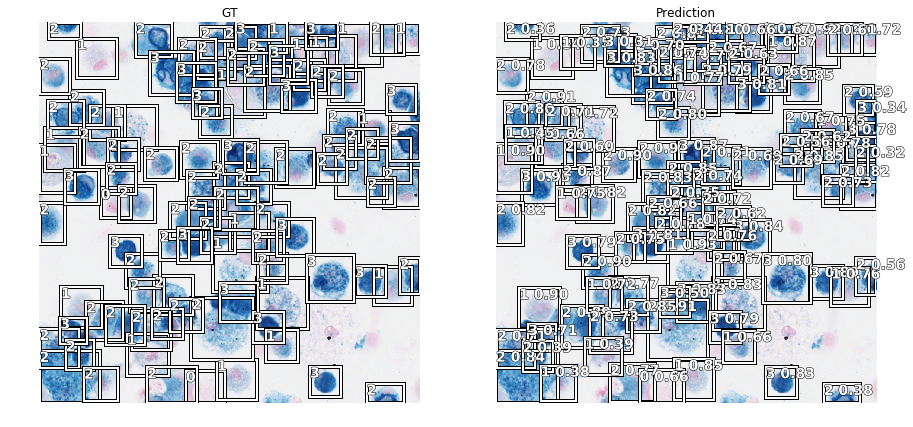

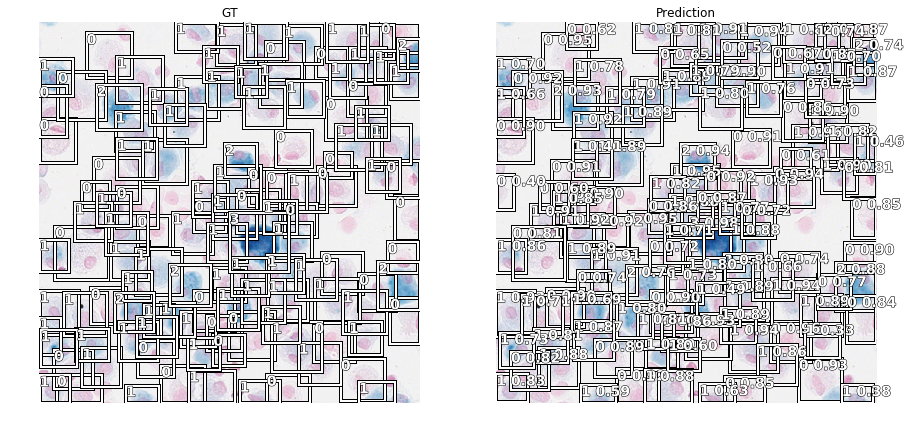

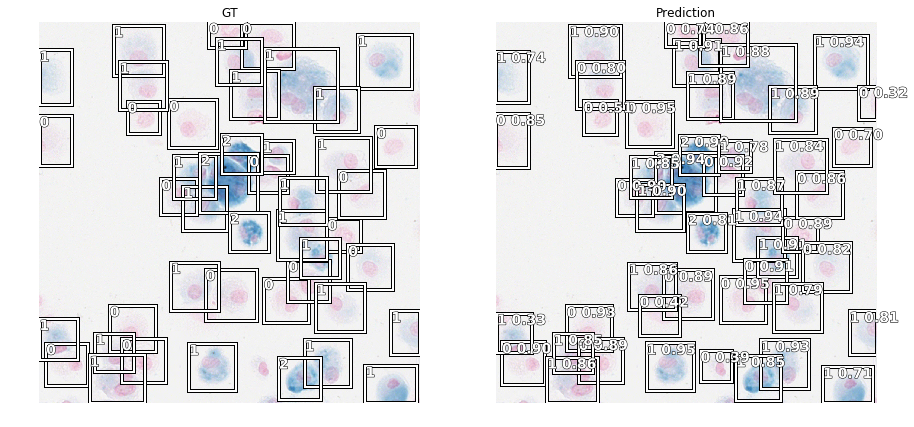

In [30]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=20)